#Notes: I ran it on Kaggle using Accelerator GPU

#Get data from gg Drive

In [1]:
# Update gdown
!pip install --upgrade --no-cache-dir gdown

  Installing build dependencies ... - \ | / - done
  Getting requirements to build wheel ... - \ | / - done
  Preparing metadata (pyproject.toml) ... - \ | / - done
  Created wheel for gdown: filename=gdown-4.4.0-py3-none-any.whl size=14775 sha256=863164b86c27965b9226e9dbf6ba8cbcefac24a290d62da06260ed88adc1e2b5
  Stored in directory: /tmp/pip-ephem-wheel-cache-joss687w/wheels/fb/c3/0e/c4d8ff8bfcb0461afff199471449f642179b74968c15b7a69c
Successfully built gdown


In [2]:
# Download data from google drive
!gdown --id 1pRcJVhzns_6eZz6iq26w6C9UdGeb4u0B

/opt/conda/lib/python3.7/site-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1pRcJVhzns_6eZz6iq26w6C9UdGeb4u0B
To: /kaggle/working/makeup_data.zip
100%|█████████████████████████████████████████| 273M/273M [00:01<00:00, 191MB/s]


In [3]:
# Unzip data
!unzip -q ./makeup_data.zip -d ./

# Import Module/Library

In [4]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt 

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.vgg19 import VGG19
from PIL import Image

In [5]:
tf.__version__

'2.6.2'

In [6]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)


1 Physical GPUs, 1 Logical GPUs


2022-03-19 10:40:28.119075: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-19 10:40:28.205105: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-19 10:40:28.205807: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-19 10:40:28.208759: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

# Config Parameters

In [7]:
BATCH_SIZE  = 1
IMG_HEIGHT  = 256
IMG_WIDTH   = 256
IMG_CHANNEL = 3

# Path to folder de-makeup data 
IMG_PATH = "./makeup_data"
BUFFER_SIZE = 100

# Load Data

In [8]:
def load(image_file):
    """
    Parameters
    ----------
    image_path : string 

    Returns
    -------
    input_image: tf.Tensor (tf.float32)  image makeup
    target_image: tf.Tensor (tf.float32) image demakeup
    """
    # Read image
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)

    #Resize image 
    image  = tf.image.resize(image, (IMG_HEIGHT, IMG_WIDTH*3))

    # Split image 
    target_image = image[:, IMG_WIDTH : IMG_WIDTH*2, :]
    input_image = image[:, IMG_WIDTH*2: :]
    
    # Convert to float32
    input_image  = tf.cast(input_image, tf.float32)
    target_image = tf.cast(target_image, tf.float32)

    return input_image, target_image

(256, 256, 3)
(256, 256, 3)


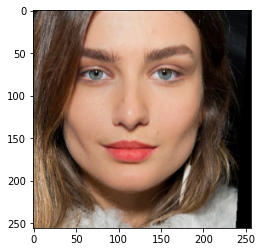

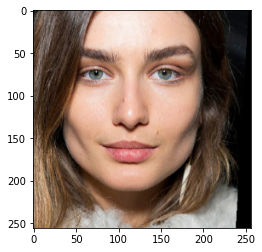

In [9]:
path = "./makeup_data/train/0.png"
input_image, target_image = load(path)

print(input_image.shape)
print(target_image.shape)


# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(input_image/255.0)
plt.figure()
plt.imshow(target_image/255.0)

In [10]:
@tf.function()
def random_flip(input_image, target_image):

    """
    Parameters
    ----------
    input_image: tf.Tensor (tf.float32)  image makeup
    target_image: tf.Tensor (tf.float32) image demakeup

    Returns
    -------
    input_image: tf.Tensor (tf.float32)  image makeup - flip (50%)
    target_image: tf.Tensor (tf.float32) image demakeup - flip (50%)
    """

    # random 50% flip right or left
    if tf.random.uniform(()) > 0.5:
        input_image  = tf.image.flip_left_right(input_image)
        target_image = tf.image.flip_left_right(target_image)

    return input_image, target_image

    
def processing_image(input_image, target_image):
    """
    Parameters
    ----------
    input_image: tf.Tensor (tf.float32)  image makeup
    target_image: tf.Tensor (tf.float32) image demakeup

    Returns
    -------
    input_image: tf.Tensor (tf.float32) - processing_image
    target_image: tf.Tensor (tf.float32)- processing_image
    """

    # Use preprocess input resnet50 because of using Pretrained model
    # input_image = keras.applications.resnet50.preprocess_input(input_image)

    input_image  = (input_image / 127.5) - 1
    target_image = (target_image / 127.5) - 1

    return input_image, target_image


def load_image_train(image_file):
    """
    ----------
    input_image: tf.Tensor (tf.float32)  image makeup
    target_image: tf.Tensor (tf.float32) image demakeup

    Returns
    -------
    input_image: tf.Tensor (tf.float32)  load image makeup for training
    target_image: tf.Tensor (tf.float32) load image demakeup for training
    """
    # load image
    input_image, target_image = load(image_file)

    # random_flip
    input_image, target_image = random_flip(input_image, target_image)

    # processing_image
    input_image, target_image = processing_image(input_image, target_image)
    
    return input_image, target_image


def load_image_val(image_file):
    """
    Parameters
    ----------
    input_image: tf.Tensor (tf.float32)  image makeup
    target_image: tf.Tensor (tf.float32) image demakeup

    Returns
    -------
    input_image: tf.Tensor (tf.float32)  load image makeup for validation
    target_image: tf.Tensor (tf.float32) load image demakeup for validation
    """
    # dùng hàm load để load ảnh 
    input_image, target_image = load(image_file)
    
    # dùng hàm processing_image để xử lý ảnh
    input_image, target_image = processing_image(input_image, target_image)
    
    return input_image, target_image

In [11]:
train_dataset = tf.data.Dataset.list_files(str(IMG_PATH + '/train/*.png'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [12]:
val_dataset = tf.data.Dataset.list_files(str(IMG_PATH + '/val/*.png'))
val_dataset = val_dataset.map(load_image_val)
val_dataset = val_dataset.batch(BATCH_SIZE)

In [13]:
test_dataset = tf.data.Dataset.list_files(str(IMG_PATH + '/test/*.png'))
test_dataset = test_dataset.map(load_image_val)
test_dataset = test_dataset.batch(BATCH_SIZE)

# Build Model 

In [14]:
class BuildRes50Unet():
    def __init__(self):
        pass
    
    def conv_block(self, inputs, num_filters):
        """Two convolution 
        Parameters
        ----------
        inputs: tf.Tensor 
        num_filters: int 

        Returns
        -------
        x: tf.Tensor 
            inputs pass 2 convlution block (Conv2D, LayerNormalization, Activation function LeakyReLU)
        """
        # Init weight
        initializer = tf.random_normal_initializer(0., 0.02)

        # Conv 1
        x = layers.Conv2D(num_filters, 3, strides=1, padding='same',
                          kernel_initializer=initializer, use_bias=False)(inputs)
        x = layers.LayerNormalization()(x)
        x = layers.LeakyReLU()(x)

        # Conv 2
        x = layers.Conv2D(num_filters, 3, strides=1, padding='same',
                          kernel_initializer=initializer, use_bias=False)(x)
        x = layers.LayerNormalization()(x)
        x = layers.LeakyReLU()(x)
        
        return x
    
    
    def upsample_concate_block(self, inputs, skip_connection, num_filters):
        """Upsampling, skip connection and via 2 convolution block
        Parameters
        ----------
        inputs: tf.Tensor 
        skip_connection: tf.Tensor 
        num_filters: int 

        Returns
        -------
        x: tf.Tensor 
        """
        
        # Upsampling 
        x = layers.UpSampling2D(interpolation='bilinear')(inputs)

        # Concatenate tensor upsample and skip connection
        x = layers.Concatenate()([x, skip_connection])

        # Via 2 convolution block
        x = self.conv_block(x, num_filters)

        return x    
    
    def build_model(self, input_shape):
        """Build Unet architecture use pretrained backbone (encoder)
        Parameters
        ----------
        input_shape: Tuple  
            
        Returns
        -------
        model: tf.keras.Model
            Unet model 
        """
        # Input layer 
        inputs = layers.Input(shape=input_shape)

        # Encoder

        # Get pretrained backbone 
        """ Pre-trained ResNet50 Model """
        resnet50 = ResNet50(include_top=False, weights="imagenet", input_tensor=inputs)

        """ Encoder """
        s1 = resnet50.layers[0].output         
        s2 = resnet50.get_layer("conv1_relu").output        
        s3 = resnet50.get_layer("conv2_block3_out").output  
        s4 = resnet50.get_layer("conv3_block4_out").output  

        """ Bridge """
        b1 = resnet50.get_layer("conv4_block6_out").output  

        """ Decoder """
        d1 = self.upsample_concate_block(b1, s4, 512)             
        d2 = self.upsample_concate_block(d1, s3, 256)                  
        d3 = self.upsample_concate_block(d2, s2, 128)                   
        d4 = self.upsample_concate_block(d3, s1, 64)  
        
        """ Output """
        # Use tanh for output [-1: 1]
        outputs = layers.Conv2D(filters=input_shape[-1], kernel_size=(1,1), activation='tanh',
                                      kernel_initializer='he_normal', use_bias=False)(d4)
        
        # Value input and output [-1:1]
        model = Model(inputs=[inputs], outputs=[outputs])
        
        return model

In [15]:
model = BuildRes50Unet()
res50Unet = model.build_model(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNEL))

94781440/94765736 [==============================] - 0s 0us/step


In [16]:
res50Unet.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

# Config and Compile Model

## Show Generated Images and Evaluation Function

In [17]:
def evaluate(model, epoch, val_ds):  
    psnr_mean = 0.0
    count = 0

    # Get input and targets from validation dataset
    for inputs, targets in val_ds:
        fake = model([inputs], training=True)
         
        # Scale to [0,1] and compute PSNR
        psnr = tf.image.psnr(fake*0.5 + 0.5, targets*0.5 + 0.5, max_val=1.0)

        __psnr_mean = tf.math.reduce_mean(psnr)
        
        psnr_mean += __psnr_mean
        count =count + 1
    
    psnr_mean = psnr_mean/count
    print('-------- psnr: ', psnr_mean.numpy(), '   ----- epoch: ', epoch, '  count: ', count)
    
    return psnr_mean
    
def generate_images(model, inputs, targets, epoch, pnsr):
    # Show images genearation from validation dataset
    fake = model([inputs], training=True)
    plt.figure(figsize=(15,20))
    
    # Get one images
    display_list = [inputs[0], targets[0], fake[0]]
    title = ['Input', 'Real', 'Predicted']    

    # Save output better performance than 
    output = np.concatenate([display_list[0], display_list[1], display_list[2]], axis=1)
    output = (output * 0.5 + 0.5) * 255
    output = output.astype(np.uint8)
    Image.fromarray(output).save(f"./save_result/validation_results/epoch:{epoch} pnsr:{pnsr}.png")
    
    # Show output
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()        

## Create Folder to save result

In [18]:
os.makedirs("./save_result", exist_ok=True)
os.makedirs("./save_result/validation_results", exist_ok=True)
os.makedirs("./save_result/testing_results", exist_ok=True)
os.makedirs("./save_result/save_model", exist_ok=True)

## Loss

In [19]:
class PeceptualLoss():
    def __init__(self, input_shape):
        self.layer_names = ['block1_conv2', 'block2_conv2', 'block3_conv4', 'block4_conv4', 'block5_conv4']
        self.extractor = self.get_extractor(input_shape)
        self.MSE = tf.keras.losses.MeanSquaredError()
        self.vgg_preprocessing = tf.keras.applications.vgg19.preprocess_input
    
    
    def get_extractor(self, input_shape):
        vgg = tf.keras.applications.VGG19(input_shape=input_shape, include_top=False, weights='imagenet')
        vgg.trainable = False
        outputs = [vgg.get_layer(name).output for name in self.layer_names]
        model = Model(inputs=vgg.input, outputs=outputs)
        
        return model
        
        
    def percep_loss(self, target_image, fake_image):
        target_image *= 255.0
        fake_image *= 255.0
        
        target_image = self.vgg_preprocessing(target_image)
        fake_image = self.vgg_preprocessing(fake_image)
        
        target_features = self.extractor(target_image)
        fake_features = self.extractor(fake_image)
        
        loss = tf.add_n([tf.reduce_mean((tar_fea-fk_fea)**2) 
                         for  tar_fea, fk_fea in zip(target_features, fake_features)])
        loss = loss/len(fake_features)
        return loss

In [20]:
# Init perceptual loss
per_loss = PeceptualLoss(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNEL))

80150528/80134624 [==============================] - 0s 0us/step


In [21]:
def generator_loss(fake, target, loss_type='L1'):
    loss_list = ["L1", "Percep"]
    assert loss_type in loss_list

    # L1 loss
    if loss_type == loss_list[0]:
        loss = tf.reduce_mean(tf.abs(fake-target))

    # Perceptual Loss
    elif loss_type == loss_list[1]:
        loss = per_loss.percep_loss(target, fake)
    
    return loss

## Optimizer

In [22]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

## Training and Evaluation

In [23]:
LOSS_TYPE = 'Percep'

In [24]:
@tf.function
def train_step(inputs, targets):
    with tf.GradientTape() as tape:
        # output
        fake = res50Unet([inputs], training=True)     
        loss = generator_loss(fake, targets, LOSS_TYPE)
        
    generator_gradients = tape.gradient(loss, res50Unet.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients, res50Unet.trainable_variables))
    
    return loss

    
    
def fit(train_ds, epochs, val_ds):
    best_pnsr = 0.0
    for epoch in range(epochs):
        # Train
        total_loss = 0.0
        for inputs, targets in train_ds:
            loss = train_step(inputs, targets)
            total_loss = total_loss + loss

        total_loss = (total_loss/len(train_ds))*100
        print('epoch: {}   loss: {}'.format(epoch, total_loss))
        
        pnsr = evaluate(res50Unet, epoch, val_ds)        
        if best_pnsr < pnsr:
            best_pnsr = pnsr
            res50Unet.save("./save_result/save_model/model-resnet-50-unet.h5")
            for inputs, targets in val_ds.take(1):
                generate_images(res50Unet, inputs, targets, epoch, best_pnsr)
                print("Save result successfully!")


2022-03-19 10:40:37.467631: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-03-19 10:40:44.473462: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


epoch: 0   loss: 7339453.0
-------- psnr:  23.13807    ----- epoch:  0   count:  100


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


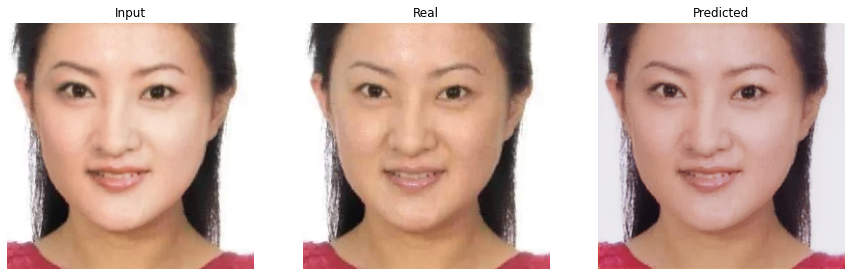

Save result successfully!
epoch: 1   loss: 3520122.75
-------- psnr:  24.661562    ----- epoch:  1   count:  100


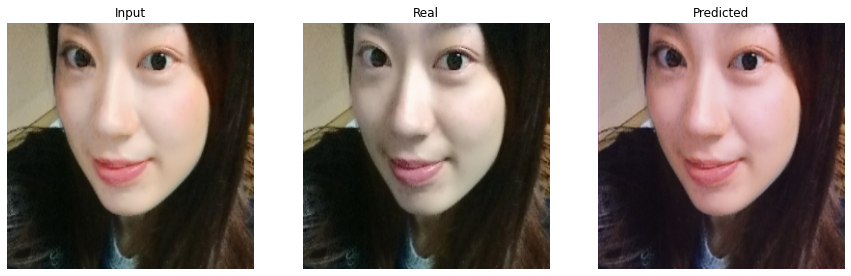

Save result successfully!
epoch: 2   loss: 2899949.75
-------- psnr:  24.978073    ----- epoch:  2   count:  100


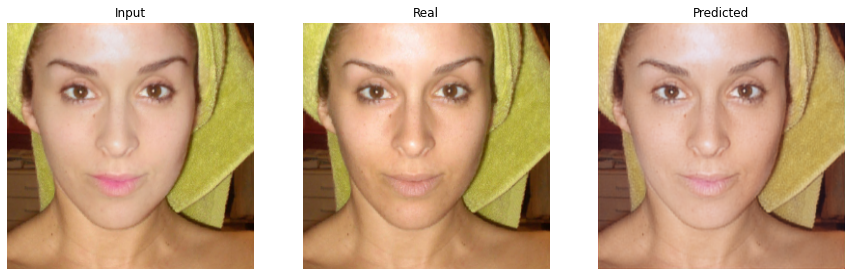

Save result successfully!
epoch: 3   loss: 2572955.5
-------- psnr:  25.560047    ----- epoch:  3   count:  100


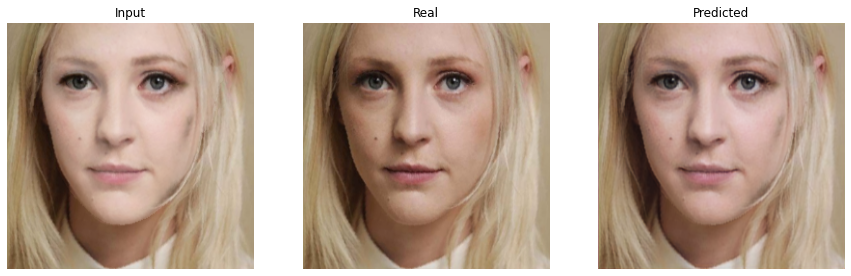

Save result successfully!
epoch: 4   loss: 2345091.5
-------- psnr:  26.547945    ----- epoch:  4   count:  100


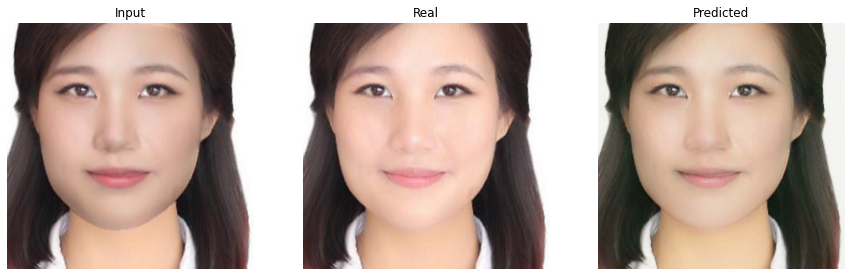

Save result successfully!
epoch: 5   loss: 2130522.75
-------- psnr:  27.202515    ----- epoch:  5   count:  100


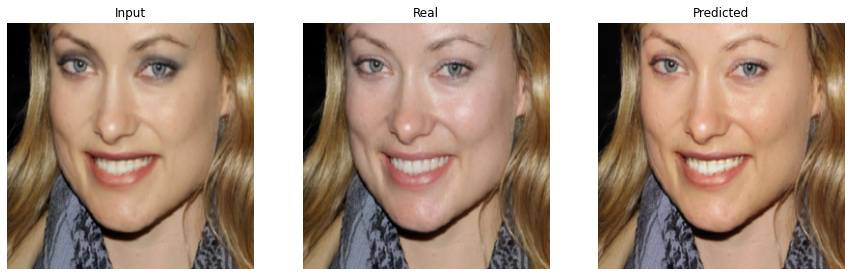

Save result successfully!
epoch: 6   loss: 1983245.5
-------- psnr:  26.908134    ----- epoch:  6   count:  100
epoch: 7   loss: 1854936.125
-------- psnr:  27.512056    ----- epoch:  7   count:  100


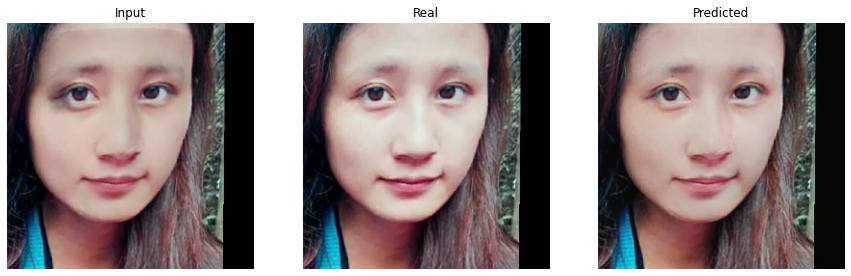

Save result successfully!
epoch: 8   loss: 1753526.375
-------- psnr:  28.324762    ----- epoch:  8   count:  100


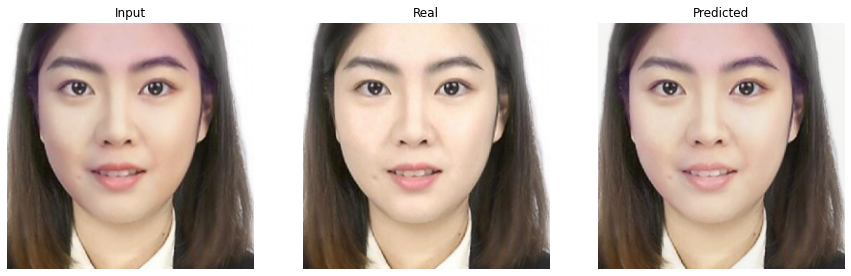

Save result successfully!
epoch: 9   loss: 1659464.875
-------- psnr:  28.20349    ----- epoch:  9   count:  100
epoch: 10   loss: 1574727.5
-------- psnr:  28.155052    ----- epoch:  10   count:  100
epoch: 11   loss: 1494272.625
-------- psnr:  28.299606    ----- epoch:  11   count:  100
epoch: 12   loss: 1430429.375
-------- psnr:  27.475906    ----- epoch:  12   count:  100
epoch: 13   loss: 1373046.125
-------- psnr:  28.34713    ----- epoch:  13   count:  100


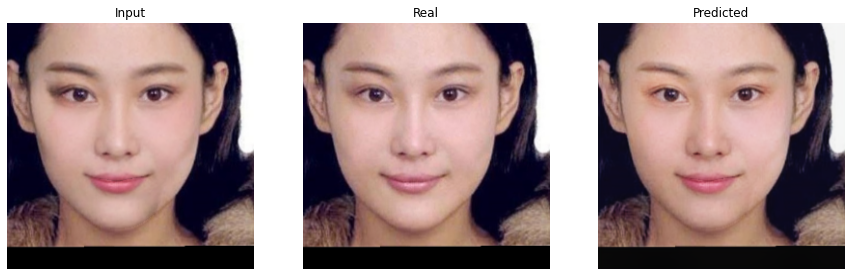

Save result successfully!
epoch: 14   loss: 1305373.5
-------- psnr:  28.527168    ----- epoch:  14   count:  100


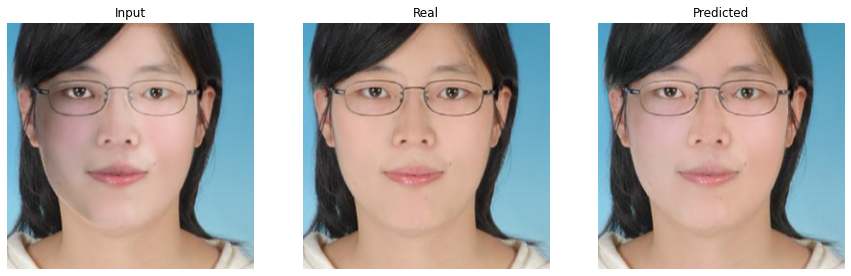

Save result successfully!
epoch: 15   loss: 1254297.875
-------- psnr:  27.783808    ----- epoch:  15   count:  100
epoch: 16   loss: 1214890.875
-------- psnr:  28.57849    ----- epoch:  16   count:  100


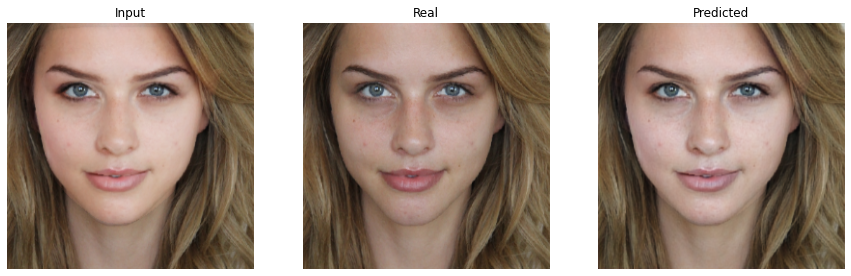

Save result successfully!
epoch: 17   loss: 1175118.125
-------- psnr:  28.776962    ----- epoch:  17   count:  100


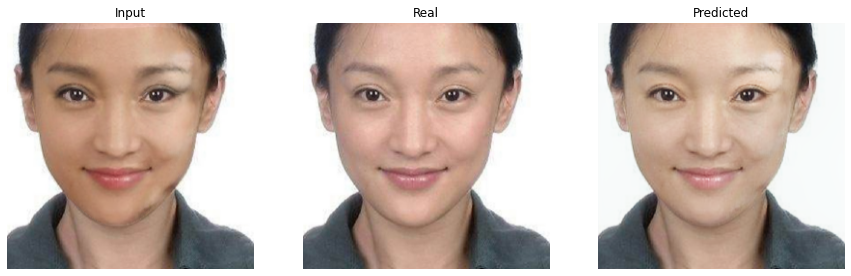

Save result successfully!
epoch: 18   loss: 1130090.0
-------- psnr:  28.98615    ----- epoch:  18   count:  100


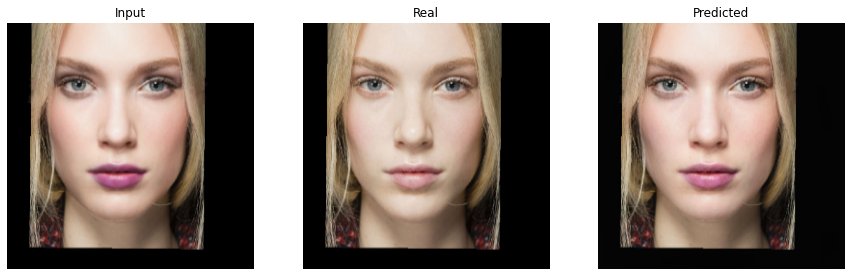

Save result successfully!
epoch: 19   loss: 1090519.875
-------- psnr:  28.717663    ----- epoch:  19   count:  100
epoch: 20   loss: 1063150.625
-------- psnr:  28.774246    ----- epoch:  20   count:  100
epoch: 21   loss: 1026961.75
-------- psnr:  28.545748    ----- epoch:  21   count:  100
epoch: 22   loss: 997632.625
-------- psnr:  28.697126    ----- epoch:  22   count:  100
epoch: 23   loss: 965123.125
-------- psnr:  28.652699    ----- epoch:  23   count:  100
epoch: 24   loss: 940651.375
-------- psnr:  29.12066    ----- epoch:  24   count:  100


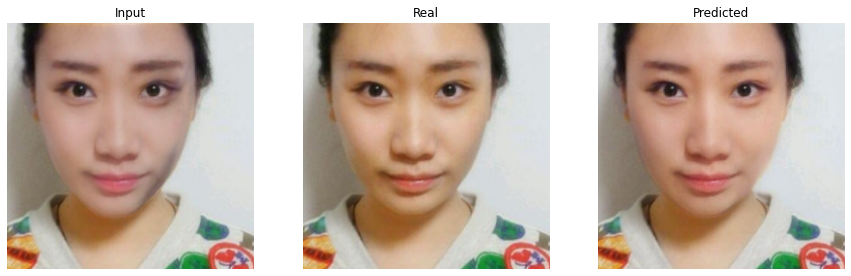

Save result successfully!
epoch: 25   loss: 915497.5625
-------- psnr:  29.161724    ----- epoch:  25   count:  100


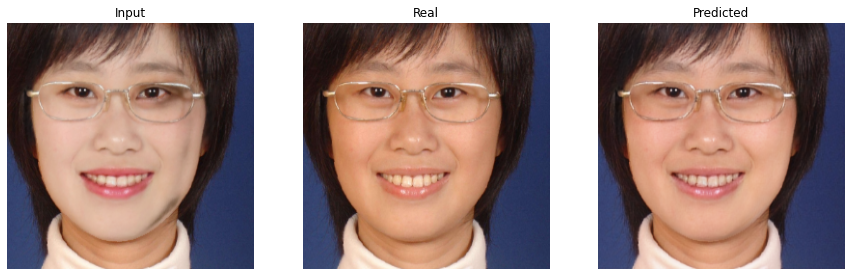

Save result successfully!
epoch: 26   loss: 890164.25
-------- psnr:  29.0032    ----- epoch:  26   count:  100
epoch: 27   loss: 863797.4375
-------- psnr:  29.244349    ----- epoch:  27   count:  100


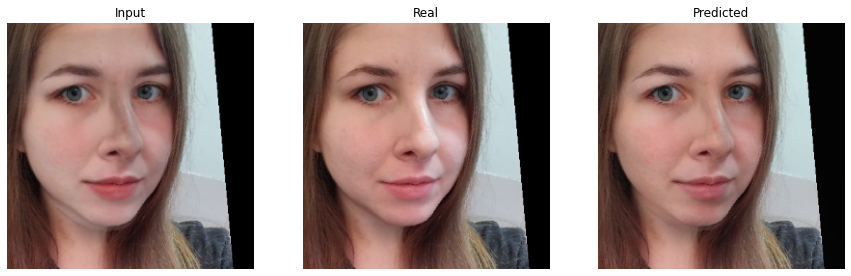

Save result successfully!
epoch: 28   loss: 840855.5
-------- psnr:  29.0452    ----- epoch:  28   count:  100
epoch: 29   loss: 808045.0625
-------- psnr:  29.45373    ----- epoch:  29   count:  100


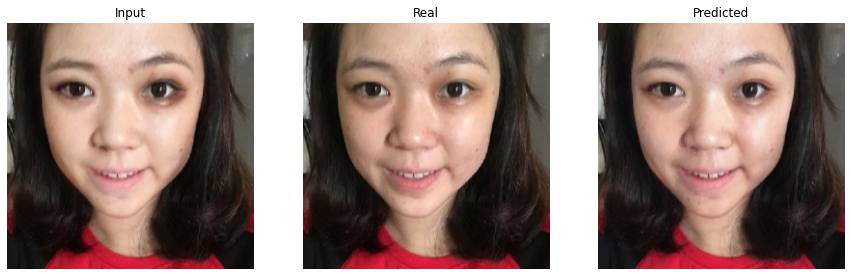

Save result successfully!
epoch: 30   loss: 806858.0
-------- psnr:  29.322239    ----- epoch:  30   count:  100
epoch: 31   loss: 774790.75
-------- psnr:  28.763575    ----- epoch:  31   count:  100
epoch: 32   loss: 758173.375
-------- psnr:  29.576565    ----- epoch:  32   count:  100


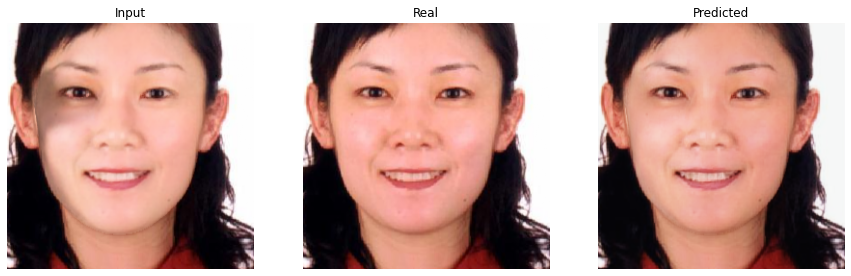

Save result successfully!
epoch: 33   loss: 743688.125
-------- psnr:  29.20976    ----- epoch:  33   count:  100
epoch: 34   loss: 715316.1875
-------- psnr:  29.5309    ----- epoch:  34   count:  100
epoch: 35   loss: 704080.75
-------- psnr:  29.44647    ----- epoch:  35   count:  100
epoch: 36   loss: 690640.25
-------- psnr:  29.119287    ----- epoch:  36   count:  100
epoch: 37   loss: 680535.3125
-------- psnr:  29.533363    ----- epoch:  37   count:  100
epoch: 38   loss: 663109.625
-------- psnr:  29.447454    ----- epoch:  38   count:  100
epoch: 39   loss: 650439.8125
-------- psnr:  29.29556    ----- epoch:  39   count:  100
epoch: 40   loss: 635469.625
-------- psnr:  29.521503    ----- epoch:  40   count:  100
epoch: 41   loss: 624610.8125
-------- psnr:  29.456804    ----- epoch:  41   count:  100
epoch: 42   loss: 606221.375
-------- psnr:  29.356901    ----- epoch:  42   count:  100
epoch: 43   loss: 602866.875
-------- psnr:  29.291582    ----- epoch:  43   count:  10

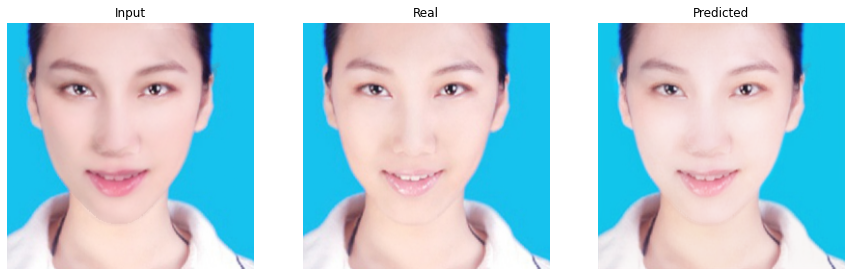

Save result successfully!
epoch: 45   loss: 580719.9375
-------- psnr:  29.723766    ----- epoch:  45   count:  100


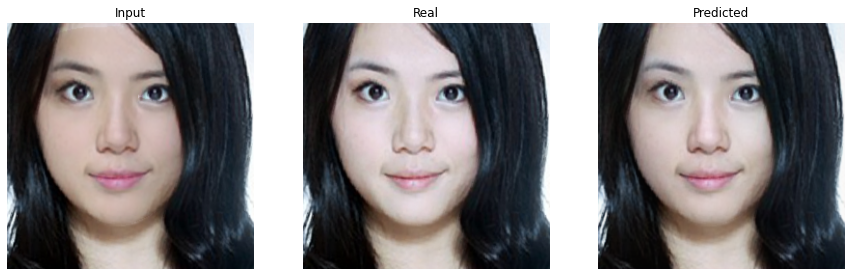

Save result successfully!
epoch: 46   loss: 578252.125
-------- psnr:  29.674309    ----- epoch:  46   count:  100
epoch: 47   loss: 559989.8125
-------- psnr:  29.730515    ----- epoch:  47   count:  100


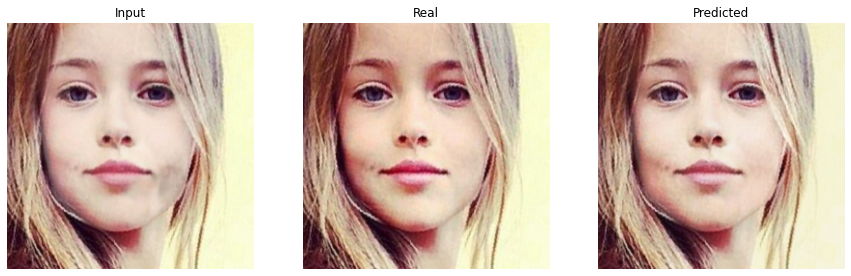

Save result successfully!
epoch: 48   loss: 550178.5
-------- psnr:  29.546276    ----- epoch:  48   count:  100
epoch: 49   loss: 540673.875
-------- psnr:  29.65287    ----- epoch:  49   count:  100
epoch: 50   loss: 540806.125
-------- psnr:  29.234642    ----- epoch:  50   count:  100
epoch: 51   loss: 527654.75
-------- psnr:  29.731104    ----- epoch:  51   count:  100


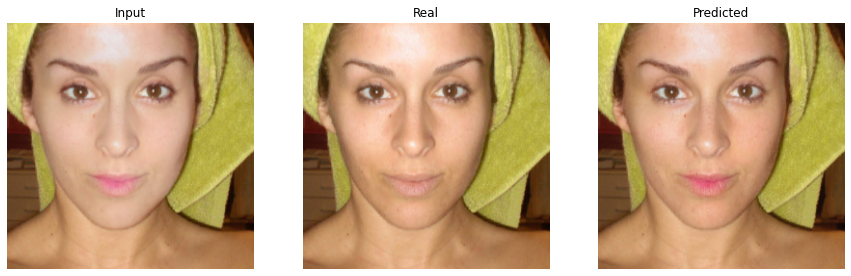

Save result successfully!
epoch: 52   loss: 519970.9375
-------- psnr:  29.668358    ----- epoch:  52   count:  100
epoch: 53   loss: 509594.28125
-------- psnr:  29.814827    ----- epoch:  53   count:  100


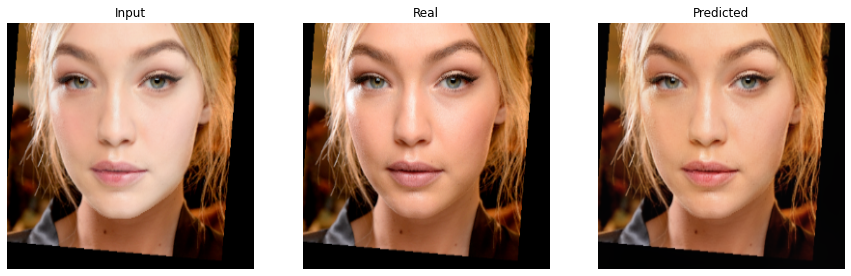

Save result successfully!
epoch: 54   loss: 500384.46875
-------- psnr:  29.686619    ----- epoch:  54   count:  100
epoch: 55   loss: 497402.78125
-------- psnr:  29.682173    ----- epoch:  55   count:  100
epoch: 56   loss: 490812.4375
-------- psnr:  29.819618    ----- epoch:  56   count:  100


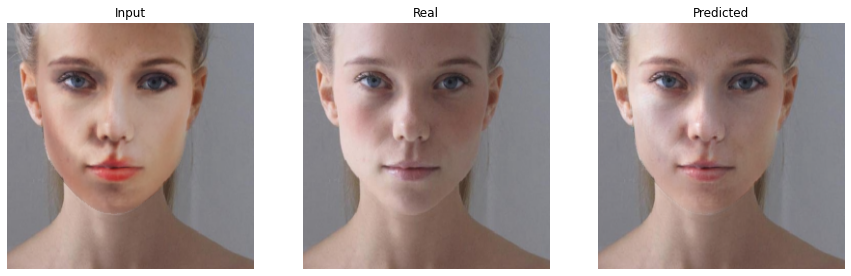

Save result successfully!
epoch: 57   loss: 483893.90625
-------- psnr:  29.597828    ----- epoch:  57   count:  100
epoch: 58   loss: 475367.78125
-------- psnr:  29.738815    ----- epoch:  58   count:  100
epoch: 59   loss: 468154.9375
-------- psnr:  29.514944    ----- epoch:  59   count:  100
epoch: 60   loss: 464172.59375
-------- psnr:  29.719639    ----- epoch:  60   count:  100
epoch: 61   loss: 456224.21875
-------- psnr:  29.750793    ----- epoch:  61   count:  100
epoch: 62   loss: 453065.8125
-------- psnr:  29.77136    ----- epoch:  62   count:  100
epoch: 63   loss: 444562.40625
-------- psnr:  29.501047    ----- epoch:  63   count:  100
epoch: 64   loss: 440454.9375
-------- psnr:  29.60239    ----- epoch:  64   count:  100
epoch: 65   loss: 434050.09375
-------- psnr:  29.745998    ----- epoch:  65   count:  100
epoch: 66   loss: 428246.78125
-------- psnr:  29.907042    ----- epoch:  66   count:  100


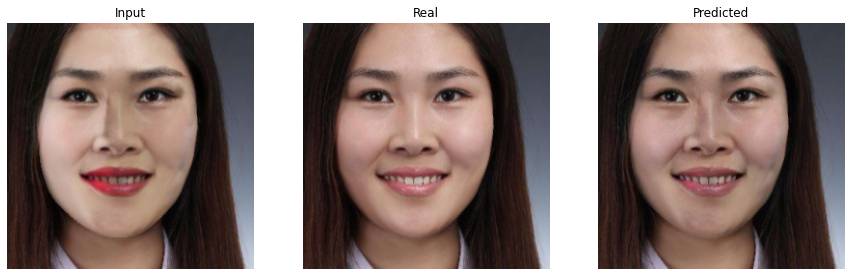

Save result successfully!
epoch: 67   loss: 422448.6875
-------- psnr:  29.807188    ----- epoch:  67   count:  100
epoch: 68   loss: 417935.3125
-------- psnr:  29.78548    ----- epoch:  68   count:  100
epoch: 69   loss: 411238.96875
-------- psnr:  29.780315    ----- epoch:  69   count:  100
epoch: 70   loss: 410700.53125
-------- psnr:  29.778763    ----- epoch:  70   count:  100
epoch: 71   loss: 405948.875
-------- psnr:  29.833567    ----- epoch:  71   count:  100
epoch: 72   loss: 400589.3125
-------- psnr:  29.820524    ----- epoch:  72   count:  100
epoch: 73   loss: 399852.03125
-------- psnr:  29.686129    ----- epoch:  73   count:  100
epoch: 74   loss: 389414.125
-------- psnr:  29.820713    ----- epoch:  74   count:  100
epoch: 75   loss: 386954.3125
-------- psnr:  29.931873    ----- epoch:  75   count:  100


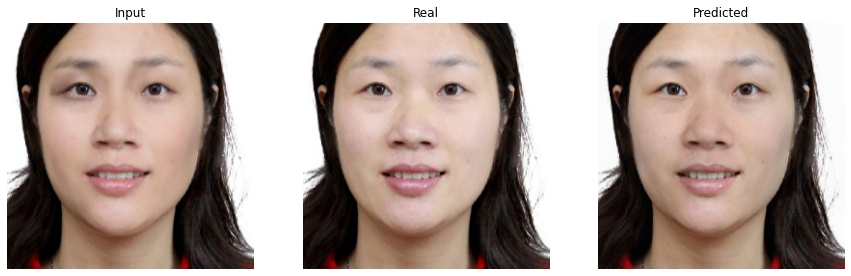

Save result successfully!
epoch: 76   loss: 383376.46875
-------- psnr:  29.78999    ----- epoch:  76   count:  100
epoch: 77   loss: 378875.5
-------- psnr:  29.883022    ----- epoch:  77   count:  100
epoch: 78   loss: 378338.71875
-------- psnr:  29.928766    ----- epoch:  78   count:  100
epoch: 79   loss: 370408.90625
-------- psnr:  29.89793    ----- epoch:  79   count:  100
epoch: 80   loss: 367202.375
-------- psnr:  29.860813    ----- epoch:  80   count:  100
epoch: 81   loss: 361843.34375
-------- psnr:  29.920235    ----- epoch:  81   count:  100
epoch: 82   loss: 360656.8125
-------- psnr:  29.808987    ----- epoch:  82   count:  100
epoch: 83   loss: 356426.625
-------- psnr:  29.901821    ----- epoch:  83   count:  100
epoch: 84   loss: 355262.65625
-------- psnr:  29.904596    ----- epoch:  84   count:  100
epoch: 85   loss: 347093.21875
-------- psnr:  29.833557    ----- epoch:  85   count:  100
epoch: 86   loss: 346555.84375
-------- psnr:  29.981762    ----- epoch:  8

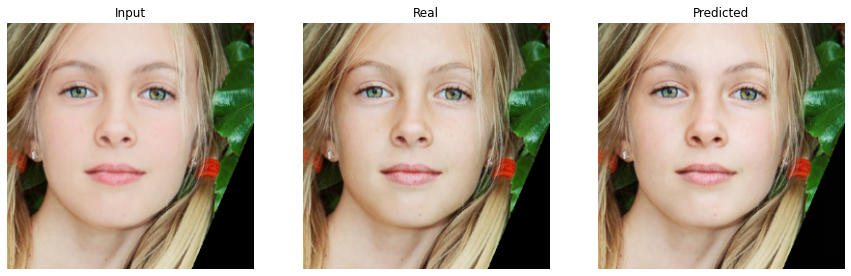

Save result successfully!
epoch: 87   loss: 343305.96875
-------- psnr:  29.826468    ----- epoch:  87   count:  100
epoch: 88   loss: 342066.65625
-------- psnr:  29.864372    ----- epoch:  88   count:  100
epoch: 89   loss: 339330.46875
-------- psnr:  29.780848    ----- epoch:  89   count:  100
epoch: 90   loss: 338215.5
-------- psnr:  29.834934    ----- epoch:  90   count:  100
epoch: 91   loss: 329759.25
-------- psnr:  29.865698    ----- epoch:  91   count:  100
epoch: 92   loss: 329359.84375
-------- psnr:  29.690884    ----- epoch:  92   count:  100
epoch: 93   loss: 324214.96875
-------- psnr:  29.889454    ----- epoch:  93   count:  100
epoch: 94   loss: 321336.40625
-------- psnr:  29.463228    ----- epoch:  94   count:  100
epoch: 95   loss: 319266.40625
-------- psnr:  29.92675    ----- epoch:  95   count:  100
epoch: 96   loss: 318759.8125
-------- psnr:  29.813854    ----- epoch:  96   count:  100
epoch: 97   loss: 316725.21875
-------- psnr:  29.822735    ----- epoch: 

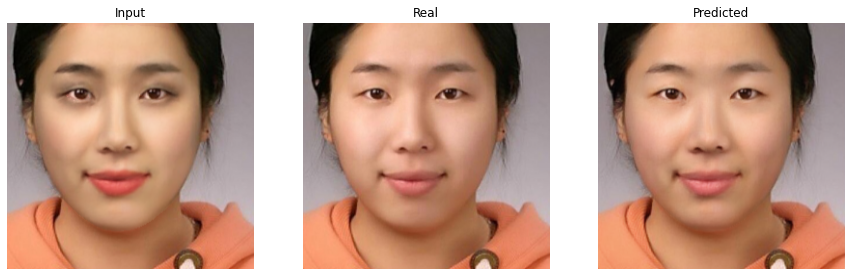

Save result successfully!
epoch: 110   loss: 285474.09375
-------- psnr:  29.886032    ----- epoch:  110   count:  100
epoch: 111   loss: 284479.75
-------- psnr:  29.960247    ----- epoch:  111   count:  100
epoch: 112   loss: 280035.5625
-------- psnr:  29.9945    ----- epoch:  112   count:  100
epoch: 113   loss: 277172.59375
-------- psnr:  29.995962    ----- epoch:  113   count:  100
epoch: 114   loss: 274157.96875
-------- psnr:  29.967335    ----- epoch:  114   count:  100
epoch: 115   loss: 272439.78125
-------- psnr:  29.965456    ----- epoch:  115   count:  100
epoch: 116   loss: 273073.0625
-------- psnr:  29.911709    ----- epoch:  116   count:  100
epoch: 117   loss: 269027.1875
-------- psnr:  29.914602    ----- epoch:  117   count:  100
epoch: 118   loss: 268195.84375
-------- psnr:  29.919426    ----- epoch:  118   count:  100
epoch: 119   loss: 267406.90625
-------- psnr:  29.930977    ----- epoch:  119   count:  100
epoch: 120   loss: 266033.21875
-------- psnr:  29.9

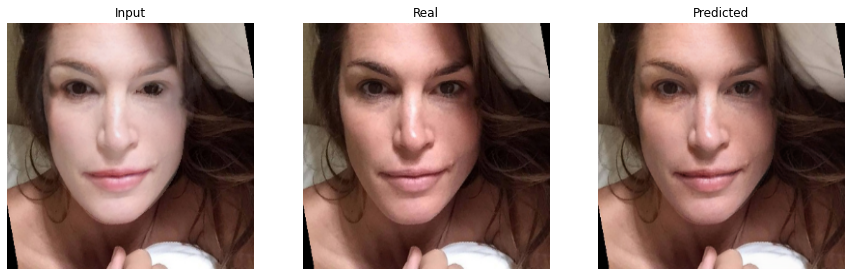

Save result successfully!
epoch: 132   loss: 244603.078125
-------- psnr:  29.98204    ----- epoch:  132   count:  100
epoch: 133   loss: 244485.234375
-------- psnr:  29.86104    ----- epoch:  133   count:  100
epoch: 134   loss: 242010.8125
-------- psnr:  29.692583    ----- epoch:  134   count:  100
epoch: 135   loss: 240000.859375
-------- psnr:  29.890806    ----- epoch:  135   count:  100
epoch: 136   loss: 239886.96875
-------- psnr:  29.853464    ----- epoch:  136   count:  100
epoch: 137   loss: 240739.359375
-------- psnr:  29.969505    ----- epoch:  137   count:  100
epoch: 138   loss: 235751.03125
-------- psnr:  29.982244    ----- epoch:  138   count:  100
epoch: 139   loss: 232382.6875
-------- psnr:  29.967213    ----- epoch:  139   count:  100
epoch: 140   loss: 232279.640625
-------- psnr:  29.900965    ----- epoch:  140   count:  100
epoch: 141   loss: 233207.765625
-------- psnr:  30.057041    ----- epoch:  141   count:  100
epoch: 142   loss: 232496.53125
-------- p

In [25]:
EPOCHS = 150
fit(train_dataset, EPOCHS, val_dataset)

## Testing Results

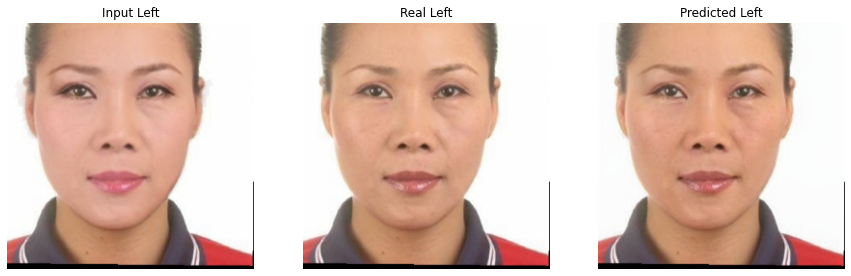

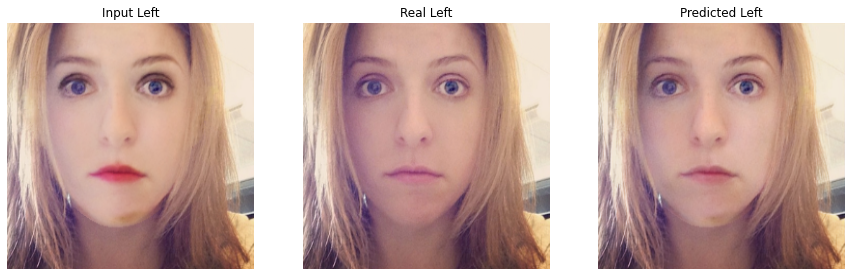

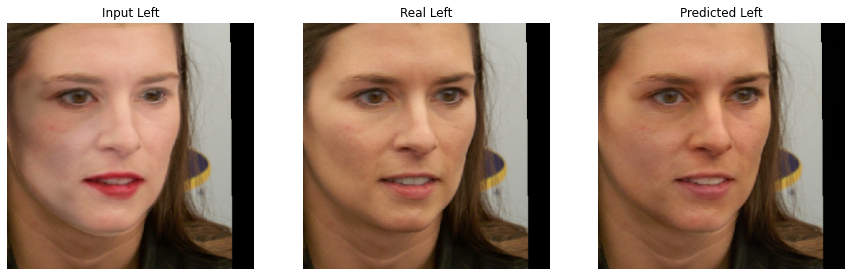

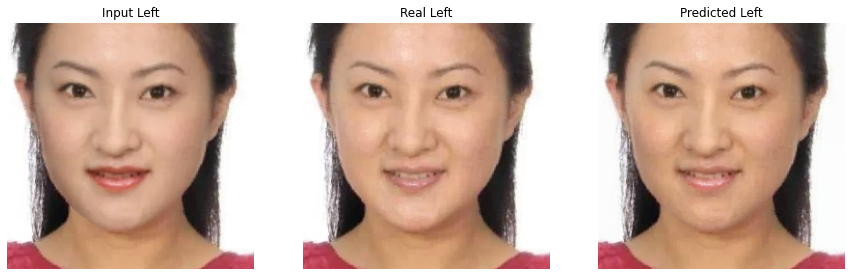

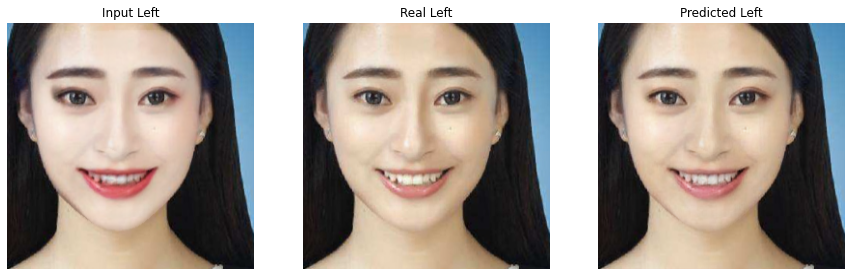

...

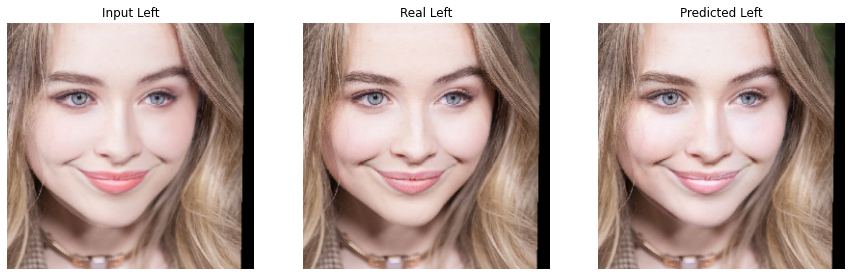

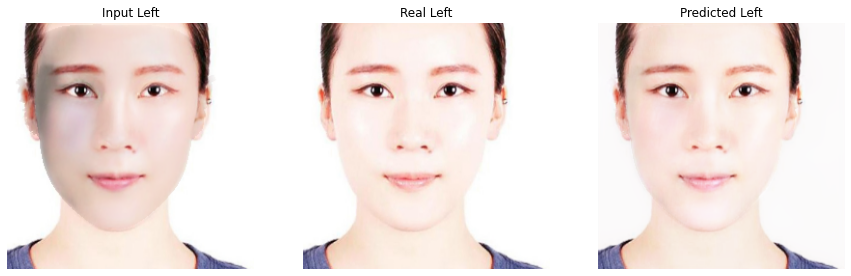

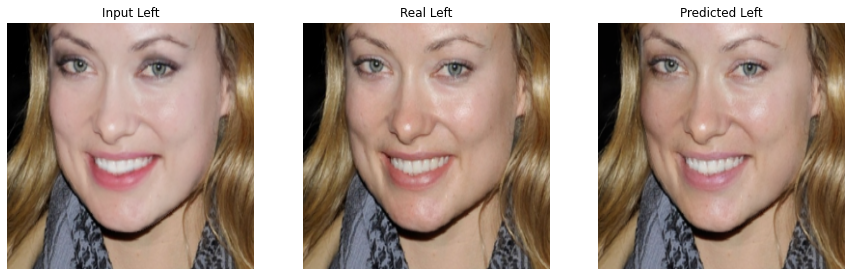

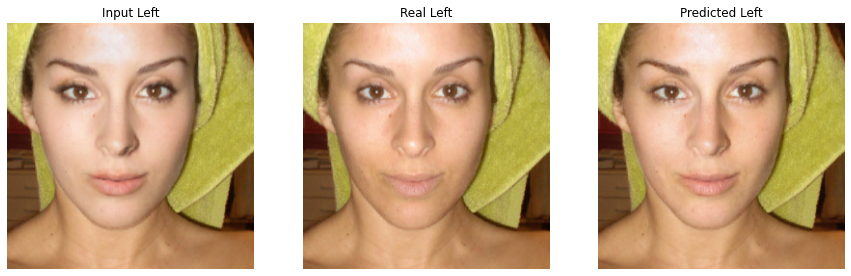

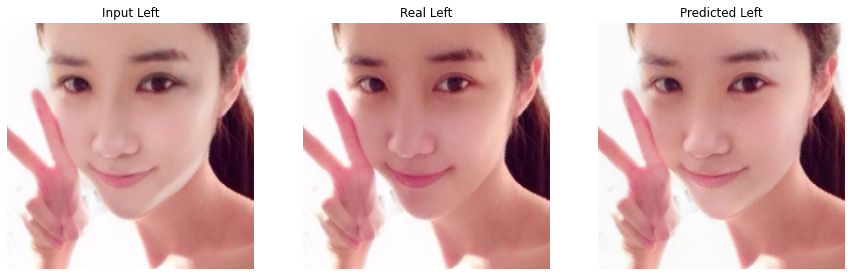

In [26]:
for x in range(15):
    for inputs, targets in test_dataset.take(1):
        fake = res50Unet([inputs], training=True)
        plt.figure(figsize=(15,20))

        display_list = [inputs[0], targets[0], fake[0]]
        title = ['Input Left', 'Real Left', 'Predicted Left']    
        
        # Save output testing
        output = np.concatenate([display_list[0], display_list[1], display_list[2]], axis=1)
        output = (output * 0.5 + 0.5) * 255
        output = output.astype(np.uint8)
        Image.fromarray(output).save(f"./save_result/testing_results/testing_result_{x}.png")
        
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
        plt.show() 

## Save Resuls

In [27]:
res50Unet.save("./save_result/save_model/model-resnet-50-unet-final")

2022-03-19 14:05:10.629697: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [28]:
!zip -r save_result.zip save_result

  adding: save_result/ (stored 0%)
  adding: save_result/validation_results/ (stored 0%)
  adding: save_result/validation_results/epoch:47 pnsr:29.730514526367188.png (deflated 0%)
  adding: save_result/validation_results/epoch:2 pnsr:24.978073120117188.png (deflated 0%)
  adding: save_result/validation_results/epoch:45 pnsr:29.723766326904297.png (deflated 0%)
  adding: save_result/validation_results/epoch:8 pnsr:28.32476234436035.png (deflated 0%)
  adding: save_result/validation_results/epoch:3 pnsr:25.560047149658203.png (deflated 0%)
  adding: save_result/validation_results/epoch:1 pnsr:24.661561965942383.png (deflated 0%)
  adding: save_result/validation_results/epoch:131 pnsr:30.0621337890625.png (deflated 0%)
  adding: save_result/validation_results/epoch:66 pnsr:29.907041549682617.png (deflated 0%)
  adding: save_result/validation_results/epoch:5 pnsr:27.2025146484375.png (deflated 0%)
  adding: save_result/validation_results/epoch:53 pnsr:29.81482696533203.png (deflated 0%)
 

#Load model to use

In [29]:
# Load Model
from tensorflow import keras
res50Unet = keras.models.load_model('../input/model-unet-resnet50-l1/model-resnet-50-unet.h5')

OSError: SavedModel file does not exist at: ../input/model-unet-resnet50-l1/model-resnet-50-unet.h5/{saved_model.pbtxt|saved_model.pb}

In [ ]:
for x in range(15):
    for inputs, targets in test_dataset.take(1):
        fake = res50Unet([inputs], training=True)
        plt.figure(figsize=(15,20))

        display_list = [inputs[0], targets[0], fake[0]]
        title = ['Input Left', 'Real Left', 'Predicted Left']    
        
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
        plt.show() 